In [1]:
from cryoS2Sdrop.analyze import *
from cryoS2Sdrop.deconvolution import tom_deconv_tomo
from skimage import exposure

PARENT_PATH = setup.PARENT_PATH

import matplotlib as mpl
from matplotlib.transforms import offset_copy
import matplotlib.patches as patches

from joblib import Parallel, delayed

mpl.rc("image", cmap="viridis")

pd.options.display.float_format = "{:,.3f}".format
pd.set_option('display.max_columns', 50)

%matplotlib inline
%config Completer.use_jedi = False
%load_ext autoreload
%autoreload 2

# Zoom-in

In [2]:
def imshow_centralSlice(dataDict, key, axes, ax_index, axis, gt_key, use_dummyData=False):
    if use_dummyData:
        aux_data = dataDict[key][0:10]
        aux_gt_data = dataDict[gt_key][0:10]
    else:
        aux_data = dataDict[key]
        aux_gt_data = dataDict[gt_key]
    
    if aux_data is not None:
        _ssim = ssim(torch.tensor(aux_gt_data).unsqueeze(0).unsqueeze(0),
                     torch.tensor(aux_data).unsqueeze(0).unsqueeze(0), 
                     data_range=1)

        _psnr = peak_signal_noise_ratio(torch.tensor(aux_gt_data).unsqueeze(0).unsqueeze(0),
                     torch.tensor(aux_data).unsqueeze(0).unsqueeze(0), 
                     data_range=1)
        
        idx_central_slices = np.array(aux_data.shape)//2
        aux_data = np.take(aux_data, idx_central_slices[axis], axis=axis)
        aux_gt_data = np.take(aux_gt_data, idx_central_slices[axis], axis=axis)
        
        a = axes[ax_index].imshow(aux_data)
        # a.axes.get_yaxis().set_visible(False)
        # a.axes.get_xaxis().set_visible(False)

        axes[ax_index].text(0.0125, 0.02, 'SSIM:%.02f' %float(_ssim), transform=axes[ax_index].transAxes, size=17, color='white')
        axes[ax_index].text(0.5, 0.02, 'PSNR:%.02f' %float(_psnr), transform=axes[ax_index].transAxes, size=17, color='white')
        
    else:
        a = None
    
    return a

## Tomo04

In [61]:
tomo04_dataDict = get_spinach_dataDict(tomo_no=4)

100%|█████████████████████████████████████████| 8/8 [06:21<00:00, 47.70s/it]


100%|█████████████████████████████████████████| 6/6 [00:00<00:00, 40.05it/s]


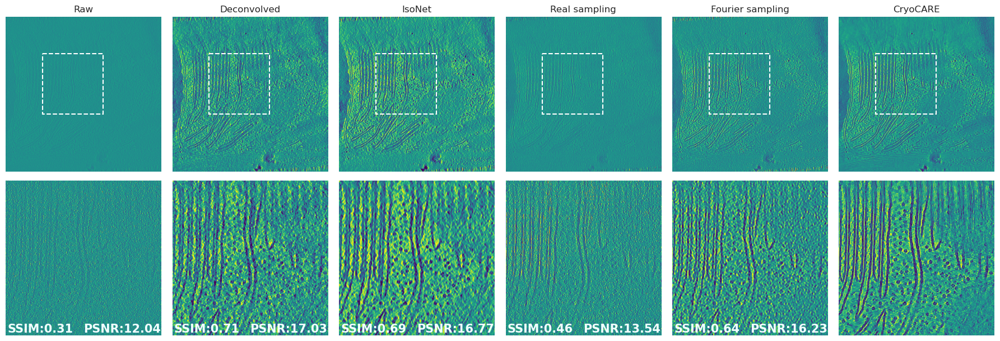

In [75]:
gt_data = tomo04_dataDict['cryoCARE_path']
tomo_shape = np.array(gt_data.shape)

idx_central_slices= tomo_shape//2

px_extent_x, px_extent_y = 180, 180
center_x, center_y = 400, 400

x0, x1 = center_x-px_extent_x, center_x+px_extent_x
y0, y1 = center_y-px_extent_y, center_y+px_extent_y

axis = 0

aux_gt_data = np.take(gt_data, idx_central_slices[axis], axis=axis)


# used_keys = ['raw_path', 'deconv_path', 'N2V_path', 'S2Sd_path', 'F2Fd_path', 'cryoCARE_path']
# cols = ['Raw', 'Deconvolved', 'N2V', 'S2Sd', 'F2Fd', 'CryoCARE']

used_keys = ['raw_path', 'deconv_path', 'isoNet_path', 'S2Sd_path', 'F2Fd_path', 'cryoCARE_path']
cols = ['Raw', 'Deconvolved', 'IsoNet', 'Real sampling', 'Fourier sampling', 'CryoCARE']


fig, ax = plt.subplots(2, len(used_keys), figsize=(18, 6), dpi=100, gridspec_kw={'height_ratios': [1, (y1-y0)/(x1-x0)]})
list(map(lambda axi: axi.set_axis_off(), ax.ravel()))
plt.tight_layout()

for axi, col in zip(ax[0], cols):
    axi.set_title(col)
    
ax_normal, ax_zoomed = ax[0], ax[1]

for idx, key in enumerate(tqdm(used_keys)):
    
    aux_data = tomo04_dataDict[key]
    aux_data = np.take(aux_data, idx_central_slices[axis], axis=axis)
    
    ax_normal[idx].imshow(aux_data)
    

    # Create a Rectangle patch
    rect = patches.Rectangle((x0, y0), 2*px_extent_x, 2*px_extent_y, linewidth=1.5, edgecolor='w', facecolor='none', linestyle='--')

    # Add the patch to the Axes
    ax_normal[idx].add_patch(rect)
    aux_data_zoomed = aux_data[y0:y1, x0:x1]

    ax_zoomed[idx].imshow(aux_data_zoomed)
    
    if key!='cryoCARE_path':
    
        _ssim = ssim(torch.tensor(aux_gt_data[y0:y1, x0:x1]).unsqueeze(0).unsqueeze(0),
                     torch.tensor(aux_data_zoomed).unsqueeze(0).unsqueeze(0), 
                     data_range=1)

        _psnr = peak_signal_noise_ratio(torch.tensor(aux_gt_data[y0:y1, x0:x1]
                                                    ).unsqueeze(0).unsqueeze(0),
                     torch.tensor(aux_data_zoomed).unsqueeze(0).unsqueeze(0), 
                     data_range=1)

        ax_zoomed[idx].text(0.0125, 0.02, 'SSIM:%.02f' %float(_ssim), transform=ax_zoomed[idx].transAxes, size=15, color='azure', weight='bold')
        ax_zoomed[idx].text(0.5, 0.02, 'PSNR:%.02f' %float(_psnr), transform=ax_zoomed[idx].transAxes, size=15, color='azure', weight='bold')


plt.show()

100%|█████████████████████████████████████████| 6/6 [00:00<00:00, 45.09it/s]


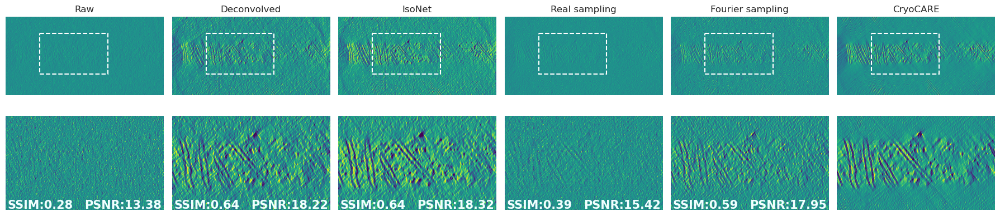

In [76]:
gt_data = tomo04_dataDict['cryoCARE_path']
tomo_shape = np.array(gt_data.shape)

idx_central_slices= tomo_shape//2

px_extent_x, px_extent_y = 200, 120
center_x, center_y = 400, 220

x0, x1 = center_x-px_extent_x, center_x+px_extent_x
y0, y1 = center_y-px_extent_y, center_y+px_extent_y

axis = 1

aux_gt_data = np.take(gt_data, idx_central_slices[axis], axis=axis)


# used_keys = ['raw_path', 'deconv_path', 'N2V_path', 'S2Sd_path', 'F2Fd_path', 'cryoCARE_path']
# cols = ['Raw', 'Deconvolved', 'N2V', 'S2Sd', 'F2Fd', 'CryoCARE']
used_keys = ['raw_path', 'deconv_path', 'isoNet_path', 'S2Sd_path', 'F2Fd_path', 'cryoCARE_path']
cols = ['Raw', 'Deconvolved', 'IsoNet', 'Real sampling', 'Fourier sampling', 'CryoCARE']


fig, ax = plt.subplots(2, len(used_keys), figsize=(18, 4), dpi=100, gridspec_kw={'height_ratios': [1, 2*(y1-y0)/(x1-x0)]})
list(map(lambda axi: axi.set_axis_off(), ax.ravel()))
plt.tight_layout()

for axi, col in zip(ax[0], cols):
    axi.set_title(col)
    
ax_normal, ax_zoomed = ax[0], ax[1]

for idx, key in enumerate(tqdm(used_keys)):
    
    aux_data = tomo04_dataDict[key]
    aux_data = np.take(aux_data, idx_central_slices[axis], axis=axis)
    
    ax_normal[idx].imshow(aux_data)
    

    # Create a Rectangle patch
    rect = patches.Rectangle((x0, y0), 2*px_extent_x, 2*px_extent_y, linewidth=1.5, edgecolor='w', facecolor='none', linestyle='--')

    # Add the patch to the Axes
    ax_normal[idx].add_patch(rect)
    aux_data_zoomed = aux_data[y0:y1, x0:x1]

    ax_zoomed[idx].imshow(aux_data_zoomed)
    
    if key!='cryoCARE_path':
    
        _ssim = ssim(torch.tensor(aux_gt_data[y0:y1, x0:x1]).unsqueeze(0).unsqueeze(0),
                     torch.tensor(aux_data_zoomed).unsqueeze(0).unsqueeze(0), 
                     data_range=1)

        _psnr = peak_signal_noise_ratio(torch.tensor(aux_gt_data[y0:y1, x0:x1]
                                                    ).unsqueeze(0).unsqueeze(0),
                     torch.tensor(aux_data_zoomed).unsqueeze(0).unsqueeze(0), 
                     data_range=1)

        ax_zoomed[idx].text(0.0125, 0.02, 'SSIM:%.02f' %float(_ssim), transform=ax_zoomed[idx].transAxes, size=15, color='azure', weight='bold')
        ax_zoomed[idx].text(0.5, 0.02, 'PSNR:%.02f' %float(_psnr), transform=ax_zoomed[idx].transAxes, size=15, color='azure', weight='bold')


plt.show()

100%|█████████████████████████████████████████| 6/6 [00:00<00:00, 45.70it/s]


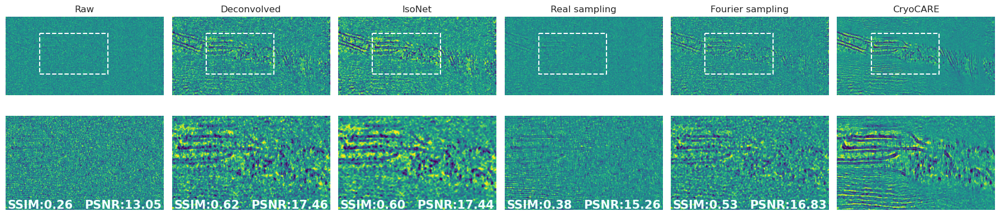

In [77]:
gt_data = tomo04_dataDict['cryoCARE_path']
tomo_shape = np.array(gt_data.shape)

idx_central_slices= tomo_shape//2

px_extent_x, px_extent_y = 200, 120
center_x, center_y = 400, 220

x0, x1 = center_x-px_extent_x, center_x+px_extent_x
y0, y1 = center_y-px_extent_y, center_y+px_extent_y

axis = 2

aux_gt_data = np.take(gt_data, idx_central_slices[axis], axis=axis)

# used_keys = ['raw_path', 'deconv_path', 'N2V_path', 'S2Sd_path', 'F2Fd_path', 'cryoCARE_path']
# cols = ['Raw', 'Deconvolved', 'N2V', 'S2Sd', 'F2Fd', 'CryoCARE']

used_keys = ['raw_path', 'deconv_path', 'isoNet_path', 'S2Sd_path', 'F2Fd_path', 'cryoCARE_path']
cols = ['Raw', 'Deconvolved', 'IsoNet', 'Real sampling', 'Fourier sampling', 'CryoCARE']

fig, ax = plt.subplots(2, len(used_keys), figsize=(18, 4), dpi=100, gridspec_kw={'height_ratios': [1, 2*(y1-y0)/(x1-x0)]})
list(map(lambda axi: axi.set_axis_off(), ax.ravel()))
plt.tight_layout()

for axi, col in zip(ax[0], cols):
    axi.set_title(col)
    
ax_normal, ax_zoomed = ax[0], ax[1]

for idx, key in enumerate(tqdm(used_keys)):
    
    aux_data = tomo04_dataDict[key]
    aux_data = np.take(aux_data, idx_central_slices[axis], axis=axis)
    
    ax_normal[idx].imshow(aux_data)
    

    # Create a Rectangle patch
    rect = patches.Rectangle((x0, y0), 2*px_extent_x, 2*px_extent_y, linewidth=1.5, edgecolor='w', facecolor='none', linestyle='--')

    # Add the patch to the Axes
    ax_normal[idx].add_patch(rect)
    aux_data_zoomed = aux_data[y0:y1, x0:x1]

    ax_zoomed[idx].imshow(aux_data_zoomed)
    
    if key!='cryoCARE_path':
    
        _ssim = ssim(torch.tensor(aux_gt_data[y0:y1, x0:x1]).unsqueeze(0).unsqueeze(0),
                     torch.tensor(aux_data_zoomed).unsqueeze(0).unsqueeze(0), 
                     data_range=1)

        _psnr = peak_signal_noise_ratio(torch.tensor(aux_gt_data[y0:y1, x0:x1]
                                                    ).unsqueeze(0).unsqueeze(0),
                     torch.tensor(aux_data_zoomed).unsqueeze(0).unsqueeze(0), 
                     data_range=1)

        ax_zoomed[idx].text(0.0125, 0.02, 'SSIM:%.02f' %float(_ssim), transform=ax_zoomed[idx].transAxes, size=15, color='azure', weight='bold')
        ax_zoomed[idx].text(0.5, 0.02, 'PSNR:%.02f' %float(_psnr), transform=ax_zoomed[idx].transAxes, size=15, color='azure', weight='bold')


plt.show()

## Tomo02

### Normal inputs

In [67]:
tomo02_dataDict = get_spinach_dataDict(tomo_no=2)

100%|█████████████████████████████████████████| 8/8 [03:47<00:00, 28.39s/it]


100%|█████████████████████████████████████████| 6/6 [00:00<00:00, 64.91it/s]


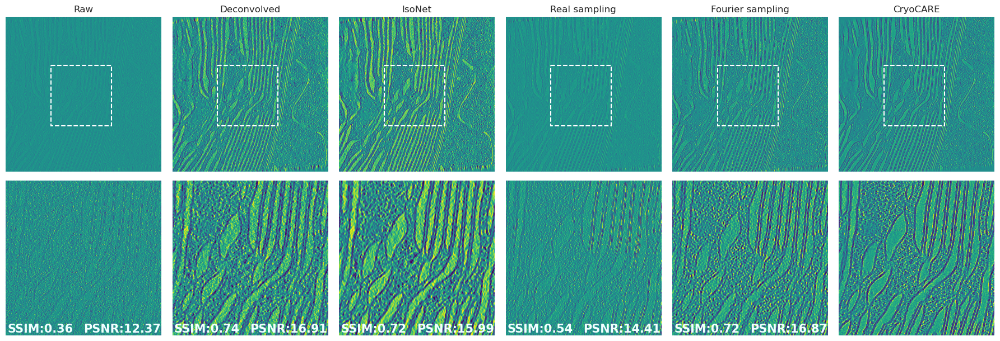

In [72]:
gt_data = tomo02_dataDict['cryoCARE_path']
tomo_shape = np.array(gt_data.shape)

idx_central_slices= tomo_shape//2

px_extent_x, px_extent_y = 180, 180
center_x, center_y = 450, 470

x0, x1 = center_x-px_extent_x, center_x+px_extent_x
y0, y1 = center_y-px_extent_y, center_y+px_extent_y

axis = 0

aux_gt_data = np.take(gt_data, idx_central_slices[axis], axis=axis)


# used_keys = ['raw_path', 'deconv_path', 'N2V_path', 'S2Sd_path', 'F2Fd_path', 'cryoCARE_path']

# cols = ['Raw', 'Deconvolved', 'N2V', 'Real sampling', 'Fourier sampling', 'CryoCARE']

used_keys = ['raw_path', 'deconv_path', 'isoNet_path', 'S2Sd_path', 'F2Fd_path', 'cryoCARE_path']
cols = ['Raw', 'Deconvolved', 'IsoNet', 'Real sampling', 'Fourier sampling', 'CryoCARE']


fig, ax = plt.subplots(2, len(used_keys), figsize=(18, 6), dpi=100, gridspec_kw={'height_ratios': [1, (y1-y0)/(x1-x0)]})
list(map(lambda axi: axi.set_axis_off(), ax.ravel()))
plt.tight_layout()

for axi, col in zip(ax[0], cols):
    axi.set_title(col)
    
ax_normal, ax_zoomed = ax[0], ax[1]

for idx, key in enumerate(tqdm(used_keys)):
    
    aux_data = tomo02_dataDict[key]
    aux_data = np.take(aux_data, idx_central_slices[axis], axis=axis)
    
    ax_normal[idx].imshow(aux_data)
    

    # Create a Rectangle patch
    rect = patches.Rectangle((x0, y0), 2*px_extent_x, 2*px_extent_y, linewidth=1.5, edgecolor='w', facecolor='none', linestyle='--')

    # Add the patch to the Axes
    ax_normal[idx].add_patch(rect)
    aux_data_zoomed = aux_data[y0:y1, x0:x1]

    ax_zoomed[idx].imshow(aux_data_zoomed)
    
    if key!='cryoCARE_path':
    
        _ssim = ssim(torch.tensor(aux_gt_data[y0:y1, x0:x1]).unsqueeze(0).unsqueeze(0),
                     torch.tensor(aux_data_zoomed).unsqueeze(0).unsqueeze(0), 
                     data_range=1)

        _psnr = peak_signal_noise_ratio(torch.tensor(aux_gt_data[y0:y1, x0:x1]
                                                    ).unsqueeze(0).unsqueeze(0),
                     torch.tensor(aux_data_zoomed).unsqueeze(0).unsqueeze(0), 
                     data_range=1)

        ax_zoomed[idx].text(0.0125, 0.02, 'SSIM:%.02f' %float(_ssim), transform=ax_zoomed[idx].transAxes, size=15, color='azure', weight='bold')
        ax_zoomed[idx].text(0.5, 0.02, 'PSNR:%.02f' %float(_psnr), transform=ax_zoomed[idx].transAxes, size=15, color='azure', weight='bold')


plt.show()

100%|█████████████████████████████████████████| 6/6 [00:00<00:00, 76.48it/s]


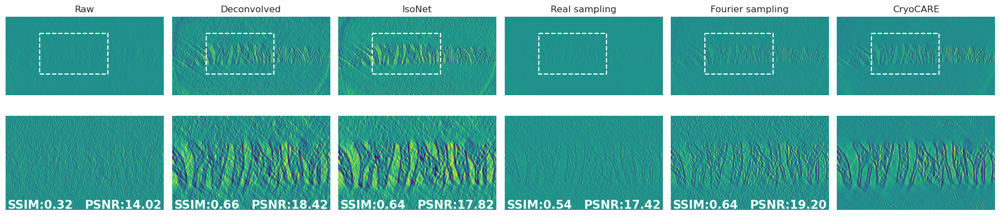

In [73]:
gt_data = tomo02_dataDict['cryoCARE_path']
tomo_shape = np.array(gt_data.shape)

idx_central_slices= tomo_shape//2

px_extent_x, px_extent_y = 200, 120
center_x, center_y = 400, 220

x0, x1 = center_x-px_extent_x, center_x+px_extent_x
y0, y1 = center_y-px_extent_y, center_y+px_extent_y

axis = 1

aux_gt_data = np.take(gt_data, idx_central_slices[axis], axis=axis)


# used_keys = ['raw_path', 'deconv_path', 'N2V_path', 'S2Sd_path', 'F2Fd_path', 'cryoCARE_path']
# cols = ['Raw', 'Deconvolved', 'N2V', 'Real sampling', 'Fourier sampling', 'CryoCARE']

used_keys = ['raw_path', 'deconv_path', 'isoNet_path', 'S2Sd_path', 'F2Fd_path', 'cryoCARE_path']
cols = ['Raw', 'Deconvolved', 'IsoNet', 'Real sampling', 'Fourier sampling', 'CryoCARE']


fig, ax = plt.subplots(2, len(used_keys), figsize=(18, 4), dpi=100, gridspec_kw={'height_ratios': [1, 2*(y1-y0)/(x1-x0)]})
list(map(lambda axi: axi.set_axis_off(), ax.ravel()))
plt.tight_layout()

for axi, col in zip(ax[0], cols):
    axi.set_title(col)
    
ax_normal, ax_zoomed = ax[0], ax[1]

for idx, key in enumerate(tqdm(used_keys)):
    
    aux_data = tomo02_dataDict[key]
    aux_data = np.take(aux_data, idx_central_slices[axis], axis=axis)
    
    ax_normal[idx].imshow(aux_data)
    

    # Create a Rectangle patch
    rect = patches.Rectangle((x0, y0), 2*px_extent_x, 2*px_extent_y, linewidth=1.5, edgecolor='w', facecolor='none', linestyle='--')

    # Add the patch to the Axes
    ax_normal[idx].add_patch(rect)
    aux_data_zoomed = aux_data[y0:y1, x0:x1]

    ax_zoomed[idx].imshow(aux_data_zoomed)
    
    if key!='cryoCARE_path':
    
        _ssim = ssim(torch.tensor(aux_gt_data[y0:y1, x0:x1]).unsqueeze(0).unsqueeze(0),
                     torch.tensor(aux_data_zoomed).unsqueeze(0).unsqueeze(0), 
                     data_range=1)

        _psnr = peak_signal_noise_ratio(torch.tensor(aux_gt_data[y0:y1, x0:x1]
                                                    ).unsqueeze(0).unsqueeze(0),
                     torch.tensor(aux_data_zoomed).unsqueeze(0).unsqueeze(0), 
                     data_range=1)

        ax_zoomed[idx].text(0.0125, 0.02, 'SSIM:%.02f' %float(_ssim), transform=ax_zoomed[idx].transAxes, size=15, color='azure', weight='bold')
        ax_zoomed[idx].text(0.5, 0.02, 'PSNR:%.02f' %float(_psnr), transform=ax_zoomed[idx].transAxes, size=15, color='azure', weight='bold')


plt.show()

100%|█████████████████████████████████████████| 6/6 [00:00<00:00, 53.00it/s]


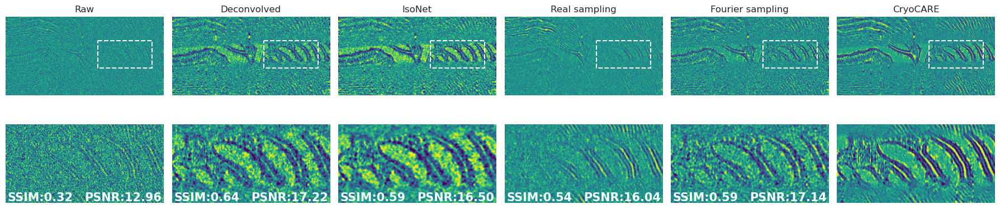

In [79]:
gt_data = tomo02_dataDict['cryoCARE_path']
tomo_shape = np.array(gt_data.shape)

idx_central_slices= tomo_shape//2

px_extent_x, px_extent_y = 160, 80
center_x, center_y = 700, 220

x0, x1 = center_x-px_extent_x, center_x+px_extent_x
y0, y1 = center_y-px_extent_y, center_y+px_extent_y

axis = 2

aux_gt_data = np.take(gt_data, idx_central_slices[axis], axis=axis)

# used_keys = ['deconv_path', 'S2Sd_path', 'F2Fd_path', 'cryoCARE_path']
# cols = ['Deconvolved', 'Real sampling', 'Fourier sampling', 'CryoCARE']

used_keys = ['raw_path', 'deconv_path', 'isoNet_path', 'S2Sd_path', 'F2Fd_path', 'cryoCARE_path']
cols = ['Raw', 'Deconvolved', 'IsoNet', 'Real sampling', 'Fourier sampling', 'CryoCARE']

fig, ax = plt.subplots(2, len(used_keys), figsize=(18, 4), dpi=100, gridspec_kw={'height_ratios': [1, 2*(y1-y0)/(x1-x0)]})
list(map(lambda axi: axi.set_axis_off(), ax.ravel()))
plt.tight_layout()

for axi, col in zip(ax[0], cols):
    axi.set_title(col)
    
ax_normal, ax_zoomed = ax[0], ax[1]

for idx, key in enumerate(tqdm(used_keys)):
    
    aux_data = tomo02_dataDict[key]
    aux_data = np.take(aux_data, idx_central_slices[axis], axis=axis)
    
    ax_normal[idx].imshow(aux_data)
    

    # Create a Rectangle patch
    rect = patches.Rectangle((x0, y0), 2*px_extent_x, 2*px_extent_y, linewidth=1.5, edgecolor='w', facecolor='none', linestyle='--')

    # Add the patch to the Axes
    ax_normal[idx].add_patch(rect)
    aux_data_zoomed = aux_data[y0:y1, x0:x1]

    ax_zoomed[idx].imshow(aux_data_zoomed)
    
    if key!='cryoCARE_path':
    
        _ssim = ssim(torch.tensor(aux_gt_data[y0:y1, x0:x1]).unsqueeze(0).unsqueeze(0),
                     torch.tensor(aux_data_zoomed).unsqueeze(0).unsqueeze(0), 
                     data_range=1)

        _psnr = peak_signal_noise_ratio(torch.tensor(aux_gt_data[y0:y1, x0:x1]
                                                    ).unsqueeze(0).unsqueeze(0),
                     torch.tensor(aux_data_zoomed).unsqueeze(0).unsqueeze(0), 
                     data_range=1)

        ax_zoomed[idx].text(0.0125, 0.02, 'SSIM:%.02f' %float(_ssim), transform=ax_zoomed[idx].transAxes, size=15, color='azure', weight='bold')
        ax_zoomed[idx].text(0.5, 0.02, 'PSNR:%.02f' %float(_psnr), transform=ax_zoomed[idx].transAxes, size=15, color='azure', weight='bold')


plt.show()

### Deconvolved inputs

100%|█████████████████████████████████████████| 4/4 [00:00<00:00, 69.22it/s]


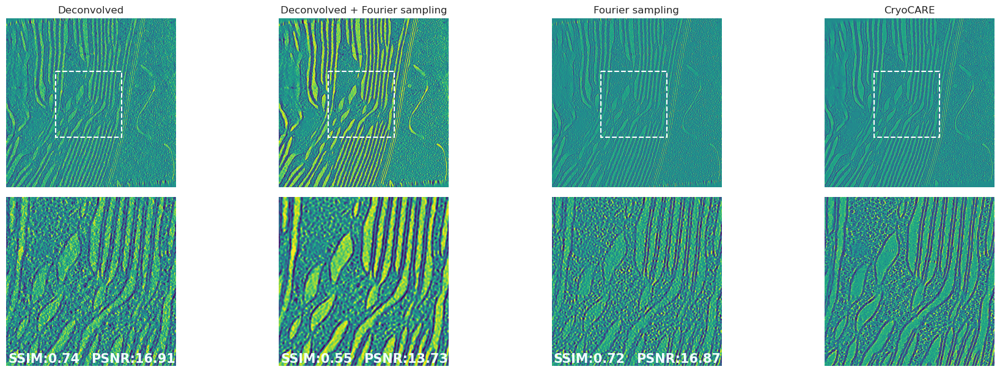

In [35]:
gt_data = tomo02_dataDict['cryoCARE_path']
tomo_shape = np.array(gt_data.shape)

idx_central_slices= tomo_shape//2

px_extent_x, px_extent_y = 180, 180
center_x, center_y = 450, 470

x0, x1 = center_x-px_extent_x, center_x+px_extent_x
y0, y1 = center_y-px_extent_y, center_y+px_extent_y

axis = 0

aux_gt_data = np.take(gt_data, idx_central_slices[axis], axis=axis)


used_keys = ['deconv_path', 'deconv_F2Fd_path', 'F2Fd_path', 'cryoCARE_path']

cols = ['Deconvolved',  'Deconvolved + Fourier sampling', 'Fourier sampling', 'CryoCARE']


fig, ax = plt.subplots(2, len(used_keys), figsize=(18, 6), dpi=100, gridspec_kw={'height_ratios': [1, (y1-y0)/(x1-x0)]})
list(map(lambda axi: axi.set_axis_off(), ax.ravel()))
plt.tight_layout()

for axi, col in zip(ax[0], cols):
    axi.set_title(col)
    
ax_normal, ax_zoomed = ax[0], ax[1]

for idx, key in enumerate(tqdm(used_keys)):
    
    aux_data = tomo02_dataDict[key]
    aux_data = np.take(aux_data, idx_central_slices[axis], axis=axis)
    
    ax_normal[idx].imshow(aux_data)
    

    # Create a Rectangle patch
    rect = patches.Rectangle((x0, y0), 2*px_extent_x, 2*px_extent_y, linewidth=1.5, edgecolor='w', facecolor='none', linestyle='--')

    # Add the patch to the Axes
    ax_normal[idx].add_patch(rect)
    aux_data_zoomed = aux_data[y0:y1, x0:x1]

    ax_zoomed[idx].imshow(aux_data_zoomed)
    
    if key!='cryoCARE_path':
    
        _ssim = ssim(torch.tensor(aux_gt_data[y0:y1, x0:x1]).unsqueeze(0).unsqueeze(0),
                     torch.tensor(aux_data_zoomed).unsqueeze(0).unsqueeze(0), 
                     data_range=1)

        _psnr = peak_signal_noise_ratio(torch.tensor(aux_gt_data[y0:y1, x0:x1]
                                                    ).unsqueeze(0).unsqueeze(0),
                     torch.tensor(aux_data_zoomed).unsqueeze(0).unsqueeze(0), 
                     data_range=1)

        ax_zoomed[idx].text(0.0125, 0.02, 'SSIM:%.02f' %float(_ssim), transform=ax_zoomed[idx].transAxes, size=15, color='azure', weight='bold')
        ax_zoomed[idx].text(0.5, 0.02, 'PSNR:%.02f' %float(_psnr), transform=ax_zoomed[idx].transAxes, size=15, color='azure', weight='bold')


plt.show()

100%|█████████████████████████████████████████| 4/4 [00:00<00:00, 60.12it/s]


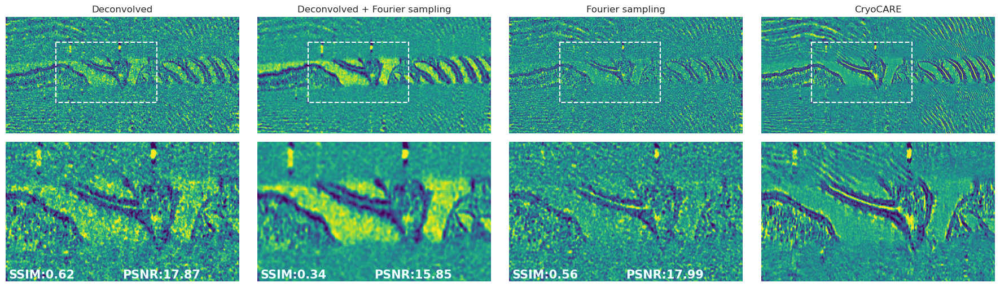

In [38]:
gt_data = tomo02_dataDict['cryoCARE_path']
tomo_shape = np.array(gt_data.shape)

idx_central_slices= tomo_shape//2

px_extent_x, px_extent_y = 200, 120
center_x, center_y = 400, 220

x0, x1 = center_x-px_extent_x, center_x+px_extent_x
y0, y1 = center_y-px_extent_y, center_y+px_extent_y

axis = 2

aux_gt_data = np.take(gt_data, idx_central_slices[axis], axis=axis)


used_keys = ['deconv_path', 'deconv_F2Fd_path', 'F2Fd_path', 'cryoCARE_path']

cols = ['Deconvolved',  'Deconvolved + Fourier sampling', 'Fourier sampling', 'CryoCARE']


fig, ax = plt.subplots(2, len(used_keys), figsize=(18, 5), dpi=100, gridspec_kw={'height_ratios': [1, 2*(y1-y0)/(x1-x0)]})
list(map(lambda axi: axi.set_axis_off(), ax.ravel()))
plt.tight_layout()

for axi, col in zip(ax[0], cols):
    axi.set_title(col)
    
ax_normal, ax_zoomed = ax[0], ax[1]

for idx, key in enumerate(tqdm(used_keys)):
    
    aux_data = tomo02_dataDict[key]
    aux_data = np.take(aux_data, idx_central_slices[axis], axis=axis)
    
    ax_normal[idx].imshow(aux_data)
    

    # Create a Rectangle patch
    rect = patches.Rectangle((x0, y0), 2*px_extent_x, 2*px_extent_y, linewidth=1.5, edgecolor='w', facecolor='none', linestyle='--')

    # Add the patch to the Axes
    ax_normal[idx].add_patch(rect)
    aux_data_zoomed = aux_data[y0:y1, x0:x1]

    ax_zoomed[idx].imshow(aux_data_zoomed)
    
    if key!='cryoCARE_path':
    
        _ssim = ssim(torch.tensor(aux_gt_data[y0:y1, x0:x1]).unsqueeze(0).unsqueeze(0),
                     torch.tensor(aux_data_zoomed).unsqueeze(0).unsqueeze(0), 
                     data_range=1)

        _psnr = peak_signal_noise_ratio(torch.tensor(aux_gt_data[y0:y1, x0:x1]
                                                    ).unsqueeze(0).unsqueeze(0),
                     torch.tensor(aux_data_zoomed).unsqueeze(0).unsqueeze(0), 
                     data_range=1)

        ax_zoomed[idx].text(0.0125, 0.02, 'SSIM:%.02f' %float(_ssim), transform=ax_zoomed[idx].transAxes, size=15, color='azure', weight='bold')
        ax_zoomed[idx].text(0.5, 0.02, 'PSNR:%.02f' %float(_psnr), transform=ax_zoomed[idx].transAxes, size=15, color='azure', weight='bold')


plt.show()

# Metrics Table (all tomos)

In [8]:
def compute_metrics(X, Y):
    if X is not None:
        X = torch.tensor(X).unsqueeze(0).unsqueeze(0)
        Y = torch.tensor(Y).unsqueeze(0).unsqueeze(0)

        _ssim = ssim(X, Y, data_range=1)
        _psnr = peak_signal_noise_ratio(X, Y, data_range=1)
    else:
        _ssim = np.nan
        _psnr = np.nan
    
    return [float(_ssim), float(_psnr)]

def parse_metricsRow(dataDict, gt_key):
    
    gt_data = dataDict[gt_key]
    
    other_keys = [key for key in dataDict.keys() if key!=gt_key]
    
    gt_data = gt_data
    
    values = Parallel(n_jobs=1)(delayed(compute_metrics)(dataDict[key], gt_data) for key in other_keys)
    
    metric_dict = dict(zip(other_keys, values))
    
    return metric_dict

def parse_all(tomo_no):
    dataDict = get_spinach_dataDict(tomo_no)
    metrics_row = parse_metricsRow(dataDict, 'cryoCARE_path')
    
    df = pd.DataFrame(metrics_row)

    df.columns = [col.replace('_path', '') for col in df.columns]
    df = df.drop('gt', axis=1)

    df['metric'] = ['PSNR', 'SSIM']
    df['tomogram'] = 'Spinach %02i' %tomo_no
    df = df.set_index(['tomogram', 'metric'])
    
    return df

In [10]:
rowList = Parallel(n_jobs=3, verbose=10)(delayed(parse_all)(tomo_no) for tomo_no in [2, 3, 10])

[Parallel(n_jobs=3)]: Using backend LokyBackend with 3 concurrent workers.


100%|██████████| 8/8 [05:59<00:00, 44.88s/it]
[Parallel(n_jobs=3)]: Done   3 out of   3 | elapsed:  6.7min remaining:    0.0s


TerminatedWorkerError: A worker process managed by the executor was unexpectedly terminated. This could be caused by a segmentation fault while calling the function or by an excessive memory usage causing the Operating System to kill the worker.

The exit codes of the workers are {SIGKILL(-9)}

In [30]:
df = pd.concat(rowList)
df

raw  deconv    N2V   S2Sd   F2Fd  isoNet
tomogram   metric                                            
Spinach 02 PSNR    0.344   0.686  0.343  0.557  0.654   0.292
           SSIM   14.159  18.018 14.123 17.033 17.966  13.834

In [31]:
df.to_latex()

'\\begin{tabular}{llrrrrrr}\n\\toprule\n           &      &    raw &  deconv &    N2V &   S2Sd &   F2Fd &  isoNet \\\\\ntomogram & metric &        &         &        &        &        &         \\\\\n\\midrule\nSpinach 02 & PSNR &  0.344 &   0.686 &  0.343 &  0.557 &  0.654 &   0.292 \\\\\n           & SSIM & 14.159 &  18.018 & 14.123 & 17.033 & 17.966 &  13.834 \\\\\n\\bottomrule\n\\end{tabular}\n'